In [1]:
import torch
import torchvision
torch.cuda.is_available()


/home/oshehata/code/virtual-staging-main/.venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


True

In [2]:
import json
import cv2
import numpy as np
import random

from cldm.model import create_model, load_state_dict_from_model
from share import *

import os
import sys

from torch.utils.data import Dataset, DataLoader


logging improved.


In [3]:
INPUT_MODEL_PATH_SD_VANILLA = "./models/v1-5-pruned.ckpt"
INPUT_MODEL_PATH_SD_INPAINT_VANILLA = './models/control_v11p_sd15_inpaint.pth'
OUTPUT_MODEL_PATH_SD_VANILLA = "./models/control_sd15_pretrained_inpainter.ckpt"

INPUT_MODEL_PATH_RV = "./models/Realistic_Vision_V3.0.ckpt"
INPUT_MODEL_INPAINT_PATH_RV = "./models/Realistic_Vision_V3.0-inpainting.ckpt"
OUTPUT_MODEL_PATH_RV = "./models/control_sd15_realistic_vision_inpainter.ckpt"

INPUT_MODEL_PATH = INPUT_MODEL_PATH_RV
INPUT_MODEL_INPAINT_PATH = INPUT_MODEL_INPAINT_PATH_RV
OUTPUT_MODEL_PATH = OUTPUT_MODEL_PATH_RV
RESUME_MODEL_PATH=OUTPUT_MODEL_PATH



OWLSAM_OBJECT_CLASSES_STR = "carpet, chair, table, sofa, bed, painting, plant"

DATA_DIR = "./training/staging_data"
PAIRED_DATA_DIR = os.path.join(DATA_DIR, "500_empty_staged_384px/500_empty_staged_384px")
UNPAIRED_DATA_DIR = os.path.join(DATA_DIR, "unpaired_384px/unpaired_384px")

STAGED = "staged"
EMPTY = "empty"
AGNOSTIC = "agnostic"
MASK = "mask"
CAPTION = "caption"
CAPTION_STAGED = f"{CAPTION}_{STAGED}"
CAPTION_EMPTY = f"{CAPTION}_{EMPTY}"

PNG = "png"


In [4]:
# # ADD CONTROL WEIGHTS  (COMMENT WHEN INFERENCING)


# assert os.path.exists(INPUT_MODEL_PATH), 'Input model does not exist.'
# assert not os.path.exists(OUTPUT_MODEL_PATH), 'Output filename already exists.'
# assert os.path.exists(os.path.dirname(OUTPUT_MODEL_PATH)
#                       ), 'Output path is not valid.'


# def get_node_name(name, parent_name):
#     if len(name) <= len(parent_name):
#         return False, ''
#     p = name[:len(parent_name)]
#     if p != parent_name:
#         return False, ''
#     return True, name[len(parent_name):]


# model = create_model(config_path='./models/control_v11p_sd15_inpaint.yaml')

# pretrained_weights = torch.load(INPUT_MODEL_PATH)
# if 'state_dict' in pretrained_weights:
#     pretrained_weights = pretrained_weights['state_dict']

# scratch_dict = model.state_dict()

# target_dict = {}
# for k in scratch_dict.keys():
#     is_control, name = get_node_name(k, 'control_')
#     if is_control:
#         copy_k = 'model.diffusion_' + name
#     else:
#         copy_k = k
#     if copy_k in pretrained_weights:
#         target_dict[k] = pretrained_weights[copy_k].clone()
#     else:
#         target_dict[k] = scratch_dict[k].clone()
#         print(f'These weights are newly added: {k}')

# print("Replacing init ControlNet parameters with pretrained inpainting ControlNet parameters.")
# # Transfer pretrained inpaint ControlNet state to the full model.
# pretrained_weights_control_inpainter = torch.load(
#     INPUT_MODEL_INPAINT_PATH)
# for k in pretrained_weights_control_inpainter.keys():
#     target_dict[k] = pretrained_weights_control_inpainter[k].clone()
#     print(
#         f'These weights have been updated with pretrained control state: {k}')


# # model.load_state_dict(target_dict, strict=True)

# state_dict = load_state_dict_from_model(model)

# torch.save(state_dict, OUTPUT_MODEL_PATH)
# # torch.save(model.state_dict(), OUTPUT_MODEL_PATH)

# print('Done.')


In [5]:
# Image captioning endpoint
from transformers import VisionEncoderDecoderModel, ViTImageProcessor, AutoTokenizer


class ImageCaptioner:
    """Class that captions images using off-the-shelf model."""
    # Model source https://huggingface.co/nlpconnect/vit-gpt2-image-captioning

    def __init__(self):
        self.model = VisionEncoderDecoderModel.from_pretrained(
            "nlpconnect/vit-gpt2-image-captioning")
        self.feature_extractor = ViTImageProcessor.from_pretrained(
            "nlpconnect/vit-gpt2-image-captioning")
        self.tokenizer = AutoTokenizer.from_pretrained(
            "nlpconnect/vit-gpt2-image-captioning")

        self.device = torch.device(
            "cuda" if torch.cuda.is_available() else "cpu")
        self.model.to(self.device)

    def caption_image(self, image):
        """Caption image."""
        pixel_values = self.feature_extractor(
            images=[image], return_tensors="pt").pixel_values
        pixel_values = pixel_values.to(self.device)

        output_ids = self.model.generate(pixel_values)

        preds = self.tokenizer.batch_decode(
            output_ids, skip_special_tokens=True)
        preds = [pred.strip() for pred in preds]
        return preds[0]


In [9]:

# # BUILD DIFFUSION DATASET (COMMENT WHEN INFERENCING )
# PAIRED_DATA_DIR = "./training/staging_data/500_empty_staged_384px/500_empty_staged_384px"
# PATH_IN_JSON= ""


# from tqdm import tqdm
# from image_captioning_endpoint import ImageCaptioner

# def _calculate_diff_mask(staged, empty, threshold=0.05):
#     # Simple algorithm for getting the difference mask.
#     # We take the difference of the grayscale staged/empty images,
#     # and then apply a threshold (default 0.05 abs diff in grayscale space).
#     # The returned diff mask is of shape HxW with ones indicating change.
#     gray_staged = cv2.cvtColor(
#         staged, cv2.COLOR_BGR2GRAY).astype(np.float32)/255
#     gray_empty = cv2.cvtColor(
#         empty, cv2.COLOR_BGR2GRAY).astype(np.float32)/255

#     # Find contours to fill holes
#     diff_mask = (np.abs(gray_empty-gray_staged) > threshold).astype(np.uint8)
#     contours, _ = cv2.findContours(
#         diff_mask, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)
#     for cnt in contours:
#         cv2.drawContours(diff_mask, [cnt], 0, 255, -1)
#     return diff_mask



# # """Prepare paired training data and datalist."""
# # Could be done more gracefully with checks but just want to get the data.
# # So we just assume that there is nothing funky with the data we unzipped and just assume all pairs 0,1,...,501 exist
# num_pairs = 501

# # Initialize image captioner
# captioner = ImageCaptioner()

# # Prepare the datalist
# datalist = []

# # Here we go over all the pairs and calculate the difference masks.
# # Using the diff masks we create the agnostic scene representation, which
# # corresponds to the scene where all fournishing is masked with grey.
# # The masks and agnostic images are dumped to disk.
# for pair_ix in tqdm(range(num_pairs)):
#     # Retrieve data for this pair ix
#     staged_image_path = os.path.join(
#         PAIRED_DATA_DIR, f"{pair_ix}_{STAGED}.{PNG}")
#     empty_image_path = os.path.join(
#         PAIRED_DATA_DIR, f"{pair_ix}_{EMPTY}.{PNG}")

#     staged = cv2.imread(staged_image_path)
#     empty = cv2.imread(empty_image_path)

#     # Just quick fix.
#     # Noticed some pairs have 1 px height diff.
#     # Fixing it here and dumping to disk.
#     if empty.shape != staged.shape:
#         h, w, _ = empty.shape
#         staged = cv2.resize(
#             staged, (w, h), interpolation=cv2.INTER_LINEAR)
#         cv2.imwrite(staged_image_path, staged)
#         staged = cv2.imread(staged_image_path)

#     # and then fill holes in the resulting mask. Filling
#     diff_mask = _calculate_diff_mask(staged, empty, threshold=0.05)

#     # We also dump the "agnostic" scene representation to disk.
#     # In this rep, the diff-mask region we want to manipulate with the
#     # ControlNet is filled with black.
#     # We specifically choose to copy the empty room room here such that
#     # the trained model can learn to paint shadows even outside the
#     # masked area.
#     agnostic = np.copy(empty)
#     agnostic[diff_mask == 255] = [0, 0, 0]

#     agnostic_image_path = os.path.join(
#         PATH_IN_JSON, f"{pair_ix}_{AGNOSTIC}.{PNG}")
#     mask_image_path = os.path.join(
#         PATH_IN_JSON, f"{pair_ix}_{MASK}.{PNG}")
#     new_staged_image_path = os.path.join(
#         PATH_IN_JSON, f"{pair_ix}_{STAGED}.{PNG}")
#     new_empty_image_path = os.path.join(
#         PATH_IN_JSON, f"{pair_ix}_{EMPTY}.{PNG}")

#     # # Write data to disk
#     # cv2.imwrite(agnostic_image_path, agnostic)
#     # cv2.imwrite(mask_image_path, diff_mask)

#     # Get image captions
#     caption_staged = captioner.caption_image(staged)
#     caption_empty = captioner.caption_image(empty)

#     # Add this element to the datalist
#     datalist.append(
#         {EMPTY: new_empty_image_path, STAGED: new_staged_image_path, AGNOSTIC: agnostic_image_path, MASK: mask_image_path, CAPTION_EMPTY: caption_empty, CAPTION_STAGED: caption_staged})

# # In a desparate attempt to get something to actually work I only hold out
# # 10 samples for eval.
# random.shuffle(datalist)
# eval_datalist, train_datalist = datalist[0:10], datalist[10:]

# # Dump datalists to disk
# with open(os.path.join("./training/dataset", 'paired_eval_datalist.json'), 'w') as fp:
#     json.dump(eval_datalist, fp)
# with open(os.path.join("./training/dataset", 'paired_train_datalist.json'), 'w') as fp:
#     json.dump(train_datalist, fp)




100%|██████████| 501/501 [06:44<00:00,  1.24it/s]


In [10]:
# # BUILD DATASET (COMMENT WHEN INFERENCING)


# from tqdm import tqdm
# from image_captioning_endpoint import ImageCaptioner

# def _calculate_diff_mask(staged, empty, threshold=0.05):
#     # Simple algorithm for getting the difference mask.
#     # We take the difference of the grayscale staged/empty images,
#     # and then apply a threshold (default 0.05 abs diff in grayscale space).
#     # The returned diff mask is of shape HxW with ones indicating change.
#     gray_staged = cv2.cvtColor(
#         staged, cv2.COLOR_BGR2GRAY).astype(np.float32)/255
#     gray_empty = cv2.cvtColor(
#         empty, cv2.COLOR_BGR2GRAY).astype(np.float32)/255

#     # Find contours to fill holes
#     diff_mask = (np.abs(gray_empty-gray_staged) > threshold).astype(np.uint8)
#     contours, _ = cv2.findContours(
#         diff_mask, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)
#     for cnt in contours:
#         cv2.drawContours(diff_mask, [cnt], 0, 255, -1)
#     return diff_mask



# # """Prepare paired training data and datalist."""
# # Could be done more gracefully with checks but just want to get the data.
# # So we just assume that there is nothing funky with the data we unzipped and just assume all pairs 0,1,...,501 exist
# num_pairs = 501

# # Initialize image captioner
# captioner = ImageCaptioner()

# # Prepare the datalist
# datalist = []

# # Here we go over all the pairs and calculate the difference masks.
# # Using the diff masks we create the agnostic scene representation, which
# # corresponds to the scene where all fournishing is masked with grey.
# # The masks and agnostic images are dumped to disk.
# for pair_ix in tqdm(range(num_pairs)):
#     # Retrieve data for this pair ix
#     staged_image_path = os.path.join(
#         PAIRED_DATA_DIR, f"{pair_ix}_{STAGED}.{PNG}")
#     empty_image_path = os.path.join(
#         PAIRED_DATA_DIR, f"{pair_ix}_{EMPTY}.{PNG}")

#     staged = cv2.imread(staged_image_path)
#     empty = cv2.imread(empty_image_path)

#     # Just quick fix.
#     # Noticed some pairs have 1 px height diff.
#     # Fixing it here and dumping to disk.
#     if empty.shape != staged.shape:
#         h, w, _ = empty.shape
#         staged = cv2.resize(
#             staged, (w, h), interpolation=cv2.INTER_LINEAR)
#         cv2.imwrite(staged_image_path, staged)
#         staged = cv2.imread(staged_image_path)

#     # and then fill holes in the resulting mask. Filling
#     diff_mask = _calculate_diff_mask(staged, empty, threshold=0.05)

#     # We also dump the "agnostic" scene representation to disk.
#     # In this rep, the diff-mask region we want to manipulate with the
#     # ControlNet is filled with black.
#     # We specifically choose to copy the empty room room here such that
#     # the trained model can learn to paint shadows even outside the
#     # masked area.
#     agnostic = np.copy(empty)
#     agnostic[diff_mask == 255] = [0, 0, 0]

#     agnostic_image_path = os.path.join(
#         PAIRED_DATA_DIR, f"{pair_ix}_{AGNOSTIC}.{PNG}")
#     mask_image_path = os.path.join(
#         PAIRED_DATA_DIR, f"{pair_ix}_{MASK}.{PNG}")

#     # Write data to disk
#     cv2.imwrite(agnostic_image_path, agnostic)
#     cv2.imwrite(mask_image_path, diff_mask)

#     # Get image captions
#     caption_staged = captioner.caption_image(staged)
#     caption_empty = captioner.caption_image(empty)

#     # Add this element to the datalist
#     datalist.append(
#         {EMPTY: empty_image_path, STAGED: staged_image_path, AGNOSTIC: agnostic_image_path, MASK: mask_image_path, CAPTION_EMPTY: caption_empty, CAPTION_STAGED: caption_staged})

# # In a desparate attempt to get something to actually work I only hold out
# # 10 samples for eval.
# random.shuffle(datalist)
# eval_datalist, train_datalist = datalist[0:10], datalist[10:]

# # Dump datalists to disk
# with open(os.path.join(DATA_DIR, 'paired_eval_datalist.json'), 'w') as fp:
#     json.dump(eval_datalist, fp)
# with open(os.path.join(DATA_DIR, 'paired_train_datalist.json'), 'w') as fp:
#     json.dump(train_datalist, fp)




In [ ]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
from diffusers.utils import load_image
import torch

base_model_path = "SG161222/Realistic_Vision_V3.0_VAE"
controlnet_path = "from_rvinpainting_masked_staged_data.ckpt"

controlnet = ControlNetModel.from_pretrained(controlnet_path, torch_dtype=torch.float16)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    base_model_path, controlnet=controlnet, torch_dtype=torch.float16
)

# speed up diffusion process with faster scheduler and memory optimization
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
# remove following line if xformers is not installed or when using Torch 2.0.
pipe.enable_xformers_memory_efficient_attention()
# # memory optimization.
# pipe.enable_model_cpu_offload()

control_image = load_image("./training/staging_data/500_empty_staged_384px/500_empty_staged_384px/0_agnostic.png")
prompt = "furnished room"

# generate image
generator = torch.manual_seed(0)
image = pipe(
    prompt, num_inference_steps=20, generator=generator, image=control_image
).images[0]

In [11]:
class PairedDataset(Dataset):
    """Super basic dataset with no augmentations."""

    def __init__(self, source_key=AGNOSTIC, target_key=STAGED, caption_key=CAPTION_STAGED):
        # These keys define the task we want to train.
        self.source_key = source_key
        self.target_key = target_key
        self.caption_key = caption_key
        self.data = []
        with open(os.path.join(DATA_DIR, "paired_train_datalist.json"), 'rb') as f:
            self.data = json.load(f)

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]

        source_filename = item[self.source_key]
        target_filename = item[self.target_key]
        prompt = item[self.caption_key]

        source = cv2.imread(source_filename)
        target = cv2.imread(target_filename)

        # Do not forget that OpenCV read images in BGR order.
        source = cv2.cvtColor(source, cv2.COLOR_BGR2RGB)
        target = cv2.cvtColor(target, cv2.COLOR_BGR2RGB)

        target = cv2.resize(
            target, (512, 512), interpolation=cv2.INTER_LINEAR)
        source = cv2.resize(
            source, (512, 512), interpolation=cv2.INTER_LINEAR)

        assert source.shape == target.shape, str(idx)

        # Normalize source images to [0, 1].
        source = source.astype(np.float32) / 255.0

        # Normalize target images to [-1, 1].
        target = (target.astype(np.float32) / 127.5) - 1.0

        return dict(jpg=target, txt=prompt, hint=source)


In [12]:
from share import *  # (COMMENT WHEN INFERENCING)
import pytorch_lightning as pl
from cldm.logger import ImageLogger
from cldm.model import create_model, load_state_dict

# Configs
# We initialize with the pretrained ControlNet checkpoint s.t. the
# model already knows to use the "RGB" information in the control input.


# resume_path = './models/control_sd15_realistic_vision_with_sd_inpainter.ckpt'
resume_path = './models/transfer_sd_sdinp_rv.ckpt'


batch_size = 4
logger_freq = 100
learning_rate = 5e-6
sd_locked = True
only_mid_control = False

# First use cpu to load models. Pytorch Lightning will automatically move it to GPUs.
staging_model = create_model(
    './models/control_v11p_sd15_inpaint.yaml').cpu()
staging_model.load_state_dict(load_state_dict(resume_path, location='cpu'))
staging_model.learning_rate = learning_rate
staging_model.sd_locked = sd_locked
staging_model.only_mid_control = only_mid_control


ControlLDM: Running in eps-prediction mode
Setting up MemoryEfficientCrossAttention. Query dim is 320, context_dim is None and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 320, context_dim is 768 and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 320, context_dim is None and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 320, context_dim is 768 and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is None and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is 768 and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is None and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is 768 and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 1280, context_dim is None and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 1280, context_

FileNotFoundError: [Errno 2] No such file or directory: './models/control_sd15_realistic_vision_with_sd_inpainter.ckpt'

In [9]:
# Misc (COMMENT WHEN INFERENCING)

# if args.mode == "masked_to_staged":
dataset = PairedDataset(source_key=AGNOSTIC,
                            target_key=STAGED, caption_key=CAPTION_STAGED)
# elif args.mode == "empty_to_staged":
# dataset = PairedDataset(
#     source_key=EMPTY, target_key=STAGED, caption_key=CAPTION_STAGED)

dataloader = DataLoader(dataset, num_workers=16, pin_memory=True,
                        batch_size=batch_size, shuffle=True)
logger = ImageLogger(batch_frequency=logger_freq)

# Train
trainer = pl.Trainer(enable_checkpointing=True, gpus=1,
                        precision=32, callbacks=[logger])
trainer.fit(staging_model, dataloader)


In [10]:
# PREDICT after moving both models to ./models/final_output

# Dirty inference code to run on single example
from cldm.ddim_hacked import DDIMSampler
from cldm.model import create_model, load_state_dict
from annotator.util import resize_image, HWC3
from pytorch_lightning import seed_everything
from share import *
import config
import matplotlib.pyplot as plt
from tqdm import tqdm
import os
import json
import random
import torch
import numpy as np
import gradio as gr
import einops
import cv2
import sys

In [11]:
def process(model, ddim_sampler, input_image, prompt, a_prompt, n_prompt, seed, num_samples=1, image_resolution=512, ddim_steps=30, guess_mode=False, strength=1, scale=9.0, eta=0.0):
    """Generate image using specific model/sampler and rgb control input image."""
    with torch.no_grad():
        detected_map = HWC3(input_image)
        img = resize_image(input_image, image_resolution)
        H, W, C = img.shape

        detected_map = cv2.resize(
            detected_map, (W, H), interpolation=cv2.INTER_NEAREST)

        control = torch.from_numpy(detected_map.copy()).float().cuda() / 255.0
        control = torch.stack([control for _ in range(num_samples)], dim=0)
        control = einops.rearrange(control, 'b h w c -> b c h w').clone()

        if seed == -1:
            seed = random.randint(0, 65535)
        seed_everything(seed)

        if config.save_memory:
            model.low_vram_shift(is_diffusing=False)

        cond = {"c_concat": [control], "c_crossattn": [
            model.get_learned_conditioning([prompt + ', ' + a_prompt] * num_samples)]}
        un_cond = {"c_concat": None if guess_mode else [control], "c_crossattn": [
            model.get_learned_conditioning([n_prompt] * num_samples)]}
        shape = (4, H // 8, W // 8)

        if config.save_memory:
            model.low_vram_shift(is_diffusing=True)

        model.control_scales = [strength * (0.825 ** float(12 - i)) for i in range(13)] if guess_mode else (
            [strength] * 13)  # Magic number. IDK why. Perhaps because 0.825**12<0.01 but 0.826**12>0.01
        samples, intermediates = ddim_sampler.sample(ddim_steps, num_samples,
                                                     shape, cond, verbose=False, eta=eta,
                                                     unconditional_guidance_scale=scale,
                                                     unconditional_conditioning=un_cond)

        if config.save_memory:
            model.low_vram_shift(is_diffusing=False)

        x_samples = model.decode_first_stage(samples)
        x_samples = (einops.rearrange(x_samples, 'b c h w -> b h w c')
                     * 127.5 + 127.5).cpu().numpy().clip(0, 255).astype(np.uint8)

        results = [x_samples[i] for i in range(num_samples)]
    return results[0]



In [12]:
EMPTY_TO_STAGED_MODEL_PATH_V0 = "./models/final_output/empty_to_staged_epoch=170-step=21032.ckpt"
EMPTY_TO_STAGED_MODEL_PATH_V1 = "./models/final_output/empty_to_staged_epoch=5-step=371.ckpt"
EMPTY_TO_STAGED_MODEL_PATH_V3 = "./models/final_output/empty_to_stage_mixed_rv_epoch=2-step=368.ckpt"


MASKED_TO_STAGED_MODEL_PATH_V0 = "./models/final_output/masked_to_staged_epoch=129-step=15989.ckpt"
MASKED_TO_STAGED_MODEL_PATH_V1 = "./models/final_output/masked_to_staged_epoch=4-step=309.ckpt"
MASKED_TO_STAGED_MODEL_PATH_V2 = "./models/final_output/masked_to_staged_epoch=160-step=9981.ckpt"
MASKED_TO_STAGED_MODEL_PATH_V3 = "./models/final_output/masked_to_stage_mixed_rv_epoch=2-step=368.ckpt"

In [13]:
# Load validation pairs, unseen by models
with open(os.path.join(DATA_DIR, "paired_eval_datalist.json"), 'rb') as f:
    eval_datalist = json.load(f)

# Run inference
# a_prompt = 'best quality, extremely detailed'
a_prompt = 'interior design, 4K, high resolution, elegant, tastefully decorated, functional'

# n_prompt = 'longbody, lowres, bad anatomy, bad hands, missing fingers, extra digit, fewer digits, cropped, worst quality, low quality'
n_prompt = "lowres, watermark, banner, logo, watermark, contactinfo, text, deformed, blurry, blur, out of focus, out of frame, surreal, extra, ugly, upholstered walls, fabric walls, plush walls, mirror, mirrored, functional, realistic, windows"

# For the layout generation phase (just predicting "diff mask" in this case), we use the empty->staged ControlNet
# to generate a rough scene in the room, and then extract a somewhat refined diff mask by segmenting out the
# inpainted features that we are interested in. This is later used to guide which regions to "furnish" in the second stage.
empty_to_staged = create_model(
    './models/control_v11p_sd15_inpaint.yaml').cpu()
empty_to_staged.load_state_dict(load_state_dict(
    EMPTY_TO_STAGED_MODEL_PATH_V0, location='cuda'), strict=False)
empty_to_staged = empty_to_staged.cuda()
empty_to_staged_ddim_sampler = DDIMSampler(empty_to_staged)



ControlLDM: Running in eps-prediction mode
Setting up MemoryEfficientCrossAttention. Query dim is 320, context_dim is None and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 320, context_dim is 768 and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 320, context_dim is None and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 320, context_dim is 768 and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is None and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is 768 and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is None and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is 768 and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 1280, context_dim is None and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 1280, context_

In [14]:

# For the generative phase, we use a different checkpoint that is specifically trained on masked inputs
# s.t. it does not make too big changes in regions where we want to perserve the original content
masked_to_staged = create_model(
    './models/control_v11p_sd15_inpaint.yaml').cpu()
masked_to_staged.load_state_dict(load_state_dict(
    MASKED_TO_STAGED_MODEL_PATH_V0, location='cuda'), strict=False)
masked_to_staged = masked_to_staged.cuda()
masked_to_staged_ddim_sampler = DDIMSampler(masked_to_staged)

ControlLDM: Running in eps-prediction mode
Setting up MemoryEfficientCrossAttention. Query dim is 320, context_dim is None and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 320, context_dim is 768 and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 320, context_dim is None and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 320, context_dim is 768 and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is None and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is 768 and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is None and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is 768 and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 1280, context_dim is None and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 1280, context_

In [15]:
# Segmentation model
from owlsam_endpoint import OwlSamSegmentor
segmentation_model = OwlSamSegmentor()

In [16]:
from transformers import AutoImageProcessor, SegformerForSemanticSegmentation
from matplotlib.colors import ListedColormap
from PIL import Image
from colors import ade_palette
from utils import *
from io import BytesIO

seg_image_processor = AutoImageProcessor.from_pretrained(
    "nvidia/segformer-b5-finetuned-ade-640-640"
)
image_segmentor = SegformerForSemanticSegmentation.from_pretrained(
    "nvidia/segformer-b5-finetuned-ade-640-640"
)

@torch.inference_mode()
@torch.autocast("cuda")
def segment_image(image, with_legend=True):
    pixel_values = seg_image_processor(image, return_tensors="pt").pixel_values
    with torch.no_grad():
        outputs = image_segmentor(pixel_values)

    seg = seg_image_processor.post_process_semantic_segmentation(
        outputs, target_sizes=[image.size[::-1]]
    )[0]
    color_seg = np.zeros((seg.shape[0], seg.shape[1], 3), dtype=np.uint8)
    palette = np.array(ade_palette())

    for label, color in enumerate(palette):
        color_seg[seg == label, :] = color

    unique_seg_colors = []
    color_legend = []
    if with_legend:
        unique_seg_colors = np.unique(color_seg.reshape(-1, color_seg.shape[-1]), axis=0)
        for label_color in unique_seg_colors:
            hex_color = rgb_to_hex(label_color)
            color_legend.append((get_color_label(hex_color), hex_color))

    color_seg = color_seg.astype(np.uint8)
    seg_image = Image.fromarray(color_seg).convert("RGB")
    
    return seg_image, color_legend, unique_seg_colors


def get_segmented_image_with_legends(segmented_image, color_legend):
    # Create a colormap using the colors from the legend
    colors = [ color for _, color in color_legend]
    # colors = [(color >> 16) / 255, ((color >> 8) & 0xFF) / 255, (color & 0xFF) / 255 for color in colors]
    cmap = ListedColormap(colors)

    # Display segmented image
    plt.figure(figsize=(30, 15))

    plt.subplot(1, 2, 1)
    plt.imshow(segmented_image, cmap=cmap, interpolation='nearest')
    plt.title('Segmented Image')
    plt.axis('off')

    # Create color legend
    patches = [plt.plot([],[], marker="o", ms=10, ls="", mec=None, color=color, 
                label=label)[0] for label, color in color_legend]
    plt.legend(handles=patches, loc='center right', title='Legend')
    plt.subplots_adjust(right=0.8)  # Adjust subplot to make room for the legend

    # plt.show()
    buffer = BytesIO()
    plt.savefig(buffer, format='png')  # Save as PNG format (or other formats as needed)
    buffer.seek(0)
    pil_image = Image.open(buffer)
    buffer.close()
    return pil_image


/home/oshehata/code/virtual-staging-main/.venv/lib/python3.10/site-packages/transformers/models/segformer/image_processing_segformer.py:103: FutureWarning: The `reduce_labels` parameter is deprecated and will be removed in a future version. Please use `do_reduce_labels` instead.
  warnings.warn(


In [17]:
def gen_stage(image_path, prompt, seed=None, num_samples=1):
    if seed is None:
        seed = int.from_bytes(os.urandom(2), "big")

    empty = cv2.imread(image_path)
    h, w, c = empty.shape
    empty = cv2.cvtColor(empty, cv2.COLOR_BGR2RGB)
    # Resize ControlNet condition for network
    empty_input = cv2.resize(
        empty, (512, 512), interpolation=cv2.INTER_LINEAR)

    # Dirty initial scene generation based on empty room
    initial_scene = process(
        empty_to_staged, empty_to_staged_ddim_sampler, empty_input, prompt, a_prompt, n_prompt, seed, num_samples)
    
    # Retrieve the "generated diff mask", corresponding to
    # a binary mask covering all objects of interest generated in the scene
    scene_layout_mask = segmentation_model.get_staged_objects_mask(
        image=initial_scene)

    # Compute the agnostic representation
    agnostic = (
        empty_input*(1-scene_layout_mask[..., None]/255).astype(np.float32)).astype(np.uint8)

    # Generate final scene using the agnostic room as input to the inpainting controlnet
    # finetuned on the small dataset.
    result = process(masked_to_staged, masked_to_staged_ddim_sampler,
                        agnostic, prompt, a_prompt, n_prompt, seed)

    # Resize to original resolution and make a fancy plot
    scene_layout_mask = cv2.resize(scene_layout_mask, (w, h))
    initial_scene = cv2.resize(initial_scene, (w, h))
    agnostic = cv2.resize(agnostic, (w, h))
    result = cv2.resize(result, (w, h))

    return empty, scene_layout_mask, agnostic, initial_scene, result
    

In [18]:
# Try on Evalset
results = []

for ix, element in tqdm(enumerate(eval_datalist[:10])):
    r_empty, r_scene_layout_mask, r_agnostic, r_initial_scene, r_result = gen_stage(image_path=element[EMPTY], prompt="a furnished room", seed=42)
    r_staged = cv2.imread(element[STAGED])
    results.append((r_empty, r_scene_layout_mask, r_agnostic, r_staged, r_initial_scene, r_result))




0it [00:00, ?it/s]Global seed set to 42


Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 31 timesteps


DDIM Sampler: 100%|██████████| 31/31 [00:08<00:00,  3.85it/s]
Global seed set to 42


Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 31 timesteps


DDIM Sampler: 100%|██████████| 31/31 [00:07<00:00,  4.17it/s]
1it [00:50, 50.31s/it]Global seed set to 42


Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 31 timesteps


DDIM Sampler: 100%|██████████| 31/31 [00:06<00:00,  4.53it/s]
Global seed set to 42


Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 31 timesteps


DDIM Sampler: 100%|██████████| 31/31 [00:07<00:00,  4.34it/s]
2it [01:38, 48.82s/it]Global seed set to 42


Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 31 timesteps


DDIM Sampler: 100%|██████████| 31/31 [00:06<00:00,  4.54it/s]
Global seed set to 42


Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 31 timesteps


DDIM Sampler: 100%|██████████| 31/31 [00:07<00:00,  4.29it/s]
3it [02:25, 48.15s/it]Global seed set to 42


Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 31 timesteps


DDIM Sampler: 100%|██████████| 31/31 [00:06<00:00,  4.66it/s]
Global seed set to 42


Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 31 timesteps


DDIM Sampler: 100%|██████████| 31/31 [00:06<00:00,  4.48it/s]
4it [03:38, 57.82s/it]Global seed set to 42


Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 31 timesteps


DDIM Sampler: 100%|██████████| 31/31 [00:06<00:00,  4.53it/s]
Global seed set to 42


Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 31 timesteps


DDIM Sampler: 100%|██████████| 31/31 [00:07<00:00,  4.37it/s]
5it [04:24, 53.59s/it]Global seed set to 42


Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 31 timesteps


DDIM Sampler: 100%|██████████| 31/31 [00:07<00:00,  4.29it/s]
Global seed set to 42


Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 31 timesteps


DDIM Sampler: 100%|██████████| 31/31 [00:07<00:00,  4.38it/s]
6it [05:30, 57.88s/it]Global seed set to 42


Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 31 timesteps


DDIM Sampler: 100%|██████████| 31/31 [00:07<00:00,  4.35it/s]
Global seed set to 42


Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 31 timesteps


DDIM Sampler: 100%|██████████| 31/31 [00:07<00:00,  4.22it/s]
7it [06:27, 57.68s/it]Global seed set to 42


Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 31 timesteps


DDIM Sampler: 100%|██████████| 31/31 [00:07<00:00,  4.26it/s]
Global seed set to 42


Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 31 timesteps


DDIM Sampler: 100%|██████████| 31/31 [00:07<00:00,  4.33it/s]
8it [07:12, 53.67s/it]Global seed set to 42


Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 31 timesteps


DDIM Sampler: 100%|██████████| 31/31 [00:07<00:00,  4.23it/s]
Global seed set to 42


Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 31 timesteps


DDIM Sampler: 100%|██████████| 31/31 [00:07<00:00,  4.37it/s]
9it [08:10, 54.94s/it]Global seed set to 42


Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 31 timesteps


DDIM Sampler: 100%|██████████| 31/31 [00:07<00:00,  4.42it/s]
Global seed set to 42


Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 31 timesteps


DDIM Sampler: 100%|██████████| 31/31 [00:07<00:00,  4.06it/s]
10it [09:11, 55.15s/it]


In [19]:
def demo(sample, file_name=None, no_gt=False):
    if no_gt:
        empty, scene_layout_mask, agnostic, initial_scene, result = sample
    else:
        empty, scene_layout_mask, agnostic, staged, initial_scene, result = sample

    # Ugly ugly ugly code to make a pretty figure
    plt.figure(figsize=(18, 8))
    plt.subplot(2, 3, 1)
    plt.imshow(empty)
    plt.title("Empty", fontsize=10)
    plt.axis("off")
    plt.subplot(2, 3, 2)
    plt.imshow(scene_layout_mask)
    plt.title("Generated layout mask", fontsize=10)
    plt.axis("off")
    plt.subplot(2, 3, 3)
    plt.imshow(agnostic)
    plt.title("Agnostic", fontsize=10)
    plt.axis("off")

    if not no_gt:
        plt.subplot(2, 3, 4)
        plt.imshow(staged)
        plt.title("staged", fontsize=10)
        plt.axis("off")

    plt.subplot(2, 3, 5)
    plt.imshow(initial_scene)
    plt.title("Initial scene", fontsize=10)
    plt.axis("off")
    plt.subplot(2, 3, 6)
    plt.imshow(result)
    plt.title("Result", fontsize=10)
    plt.axis("off")
    
    if file_name is not None:
        plt.savefig(f"./results_eval/inference_example_{ix}.png", dpi=300)

    plt.tight_layout()
    plt.show()

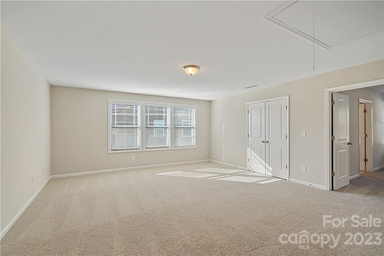

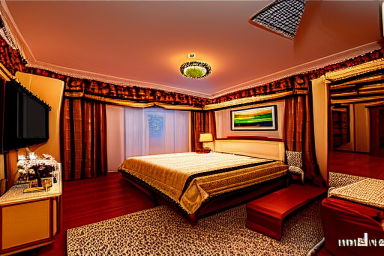

<PIL.PngImagePlugin.PngImageFile image mode=RGBA size=3000x1500>

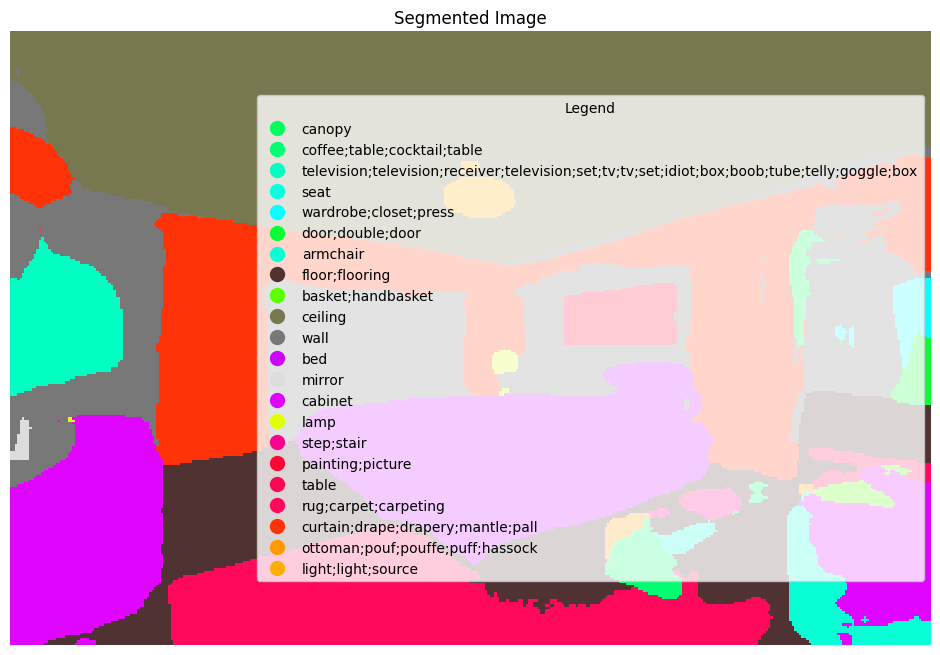

In [53]:
input_original = Image.fromarray(results[3][0]).convert("RGB")
input_for_seg = Image.fromarray(results[3][4]).convert("RGB")
segmented_image, color_legend, unique_colors = segment_image(input_for_seg, with_legend=True)
segments_with_legend = get_segmented_image_with_legends(segmented_image, color_legend)
display(input_original, input_for_seg, segments_with_legend)

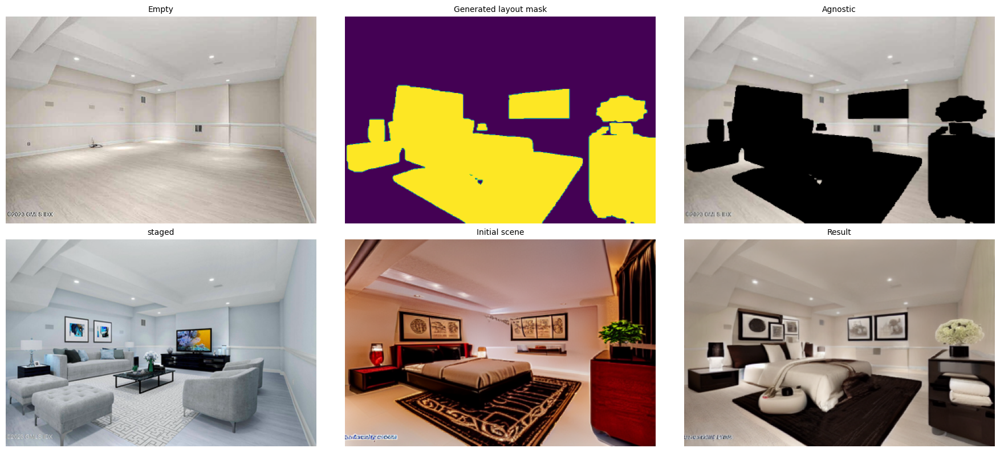

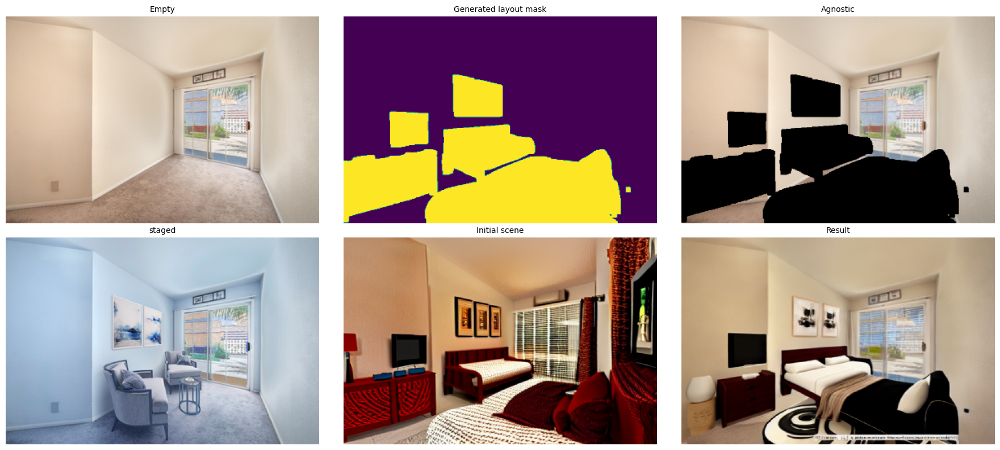

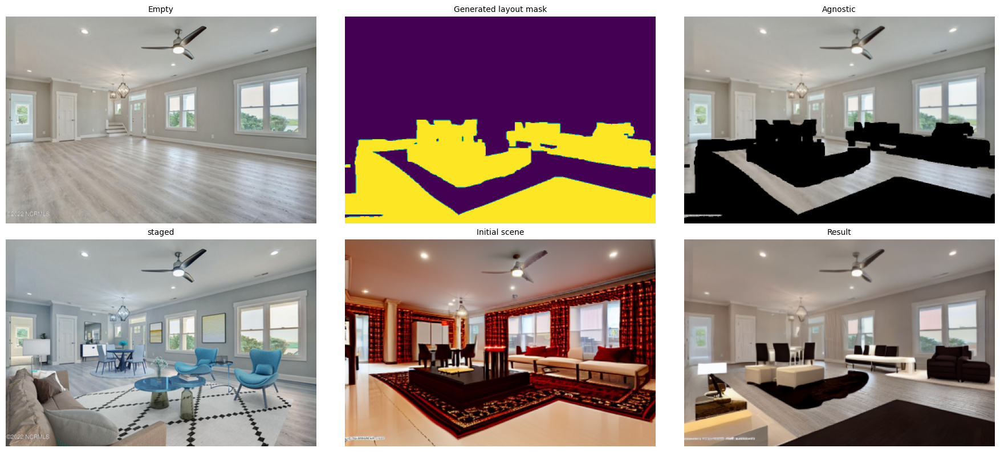

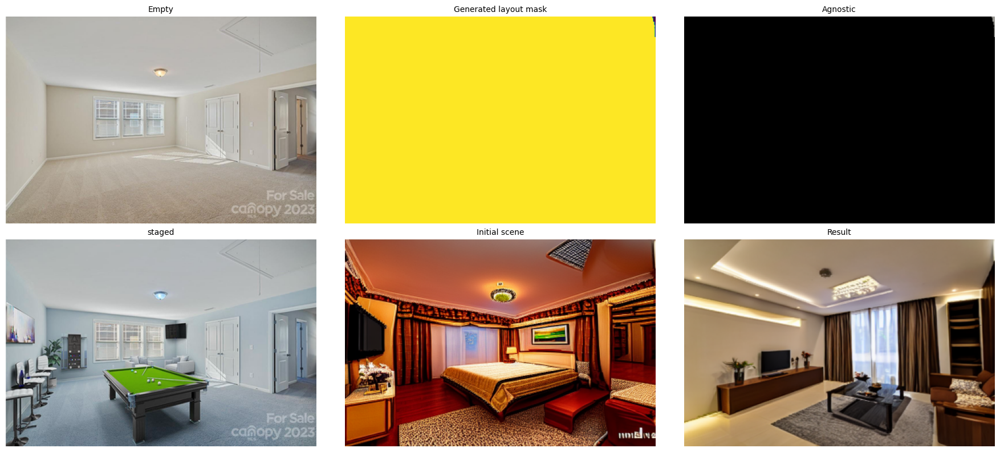

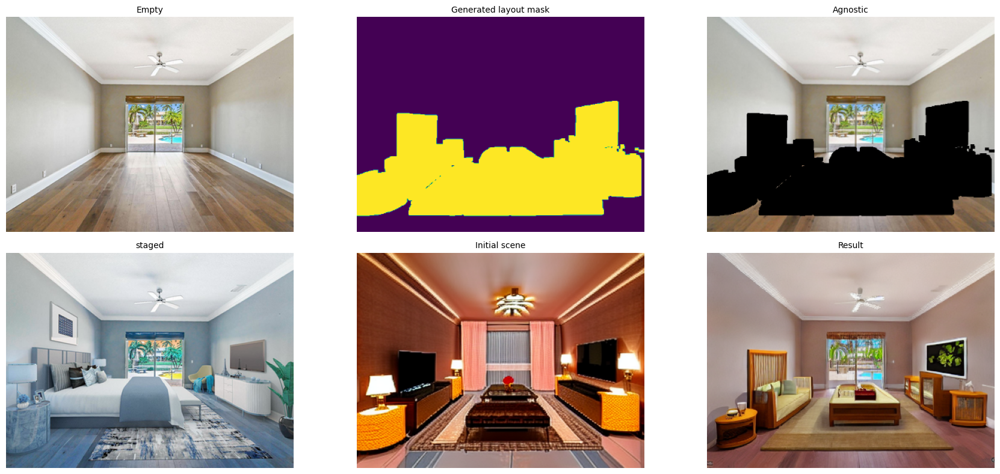

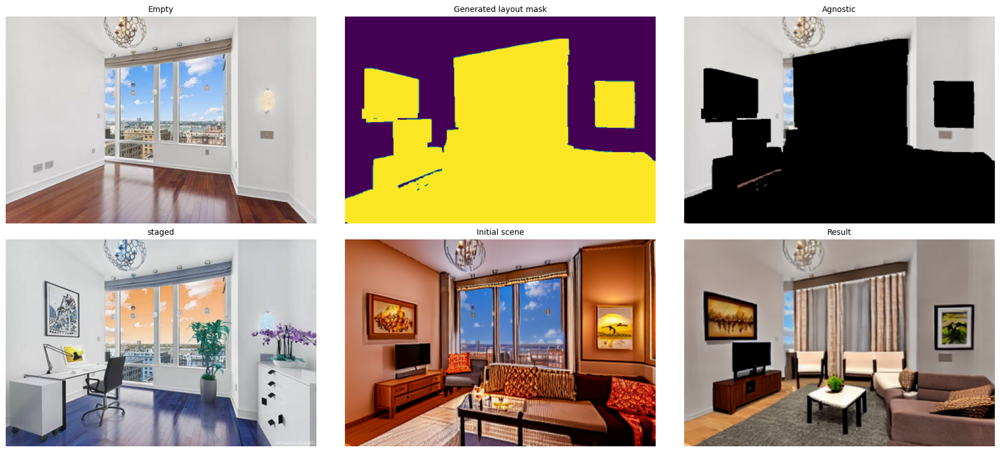

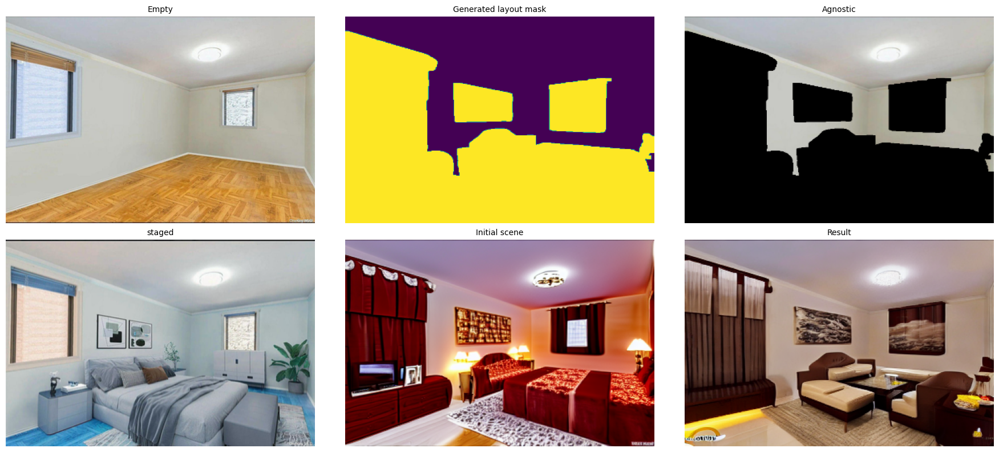

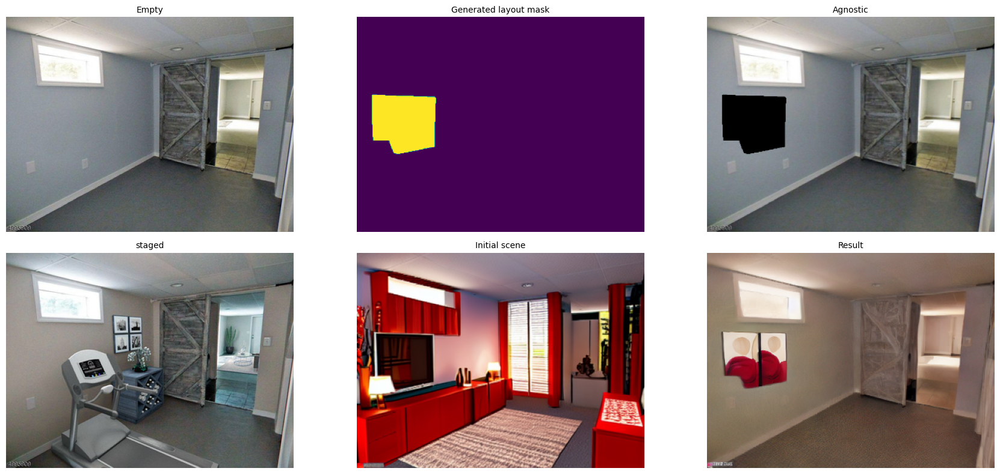

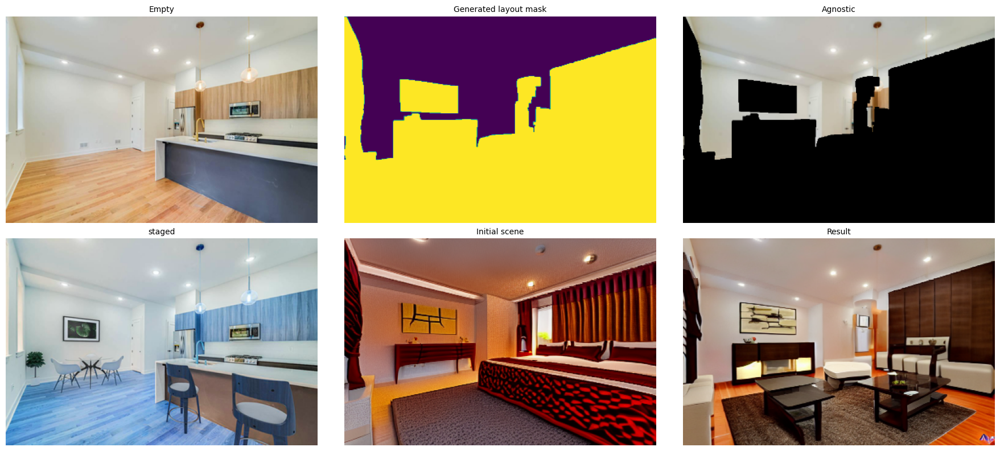

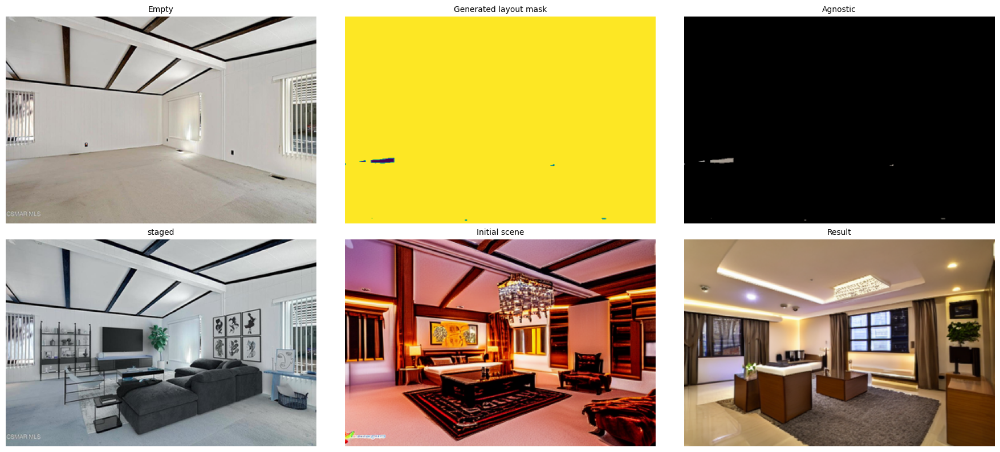

In [40]:
from datetime import datetime

eval_dir_name = datetime.now().strftime("%Y-%m-%d_%H:%M:%S")
os.makedirs(f"./results_eval/{eval_dir_name}")
for idx, res in enumerate(results):
    file_name = f"./results_eval/{eval_dir_name}/inference_example_{idx}.png"
    demo(res, file_name)

Global seed set to 1800


Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 31 timesteps


DDIM Sampler:   0%|          | 0/31 [00:00<?, ?it/s]

DDIM Sampler: 100%|██████████| 31/31 [00:07<00:00,  4.39it/s]
Global seed set to 1800


Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 31 timesteps


DDIM Sampler: 100%|██████████| 31/31 [00:07<00:00,  4.19it/s]


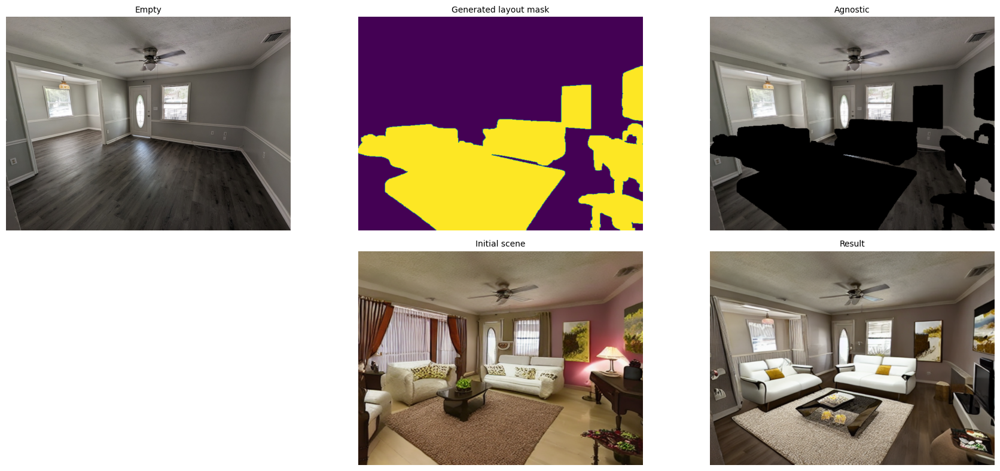

In [21]:
path = "./test_images/Henry - v2/Henry_Living:Dining.jpg"
prompt = "a furnished living room. no carpet"
generated_images = gen_stage(path, prompt, seed=None)
demo(generated_images, no_gt=True)

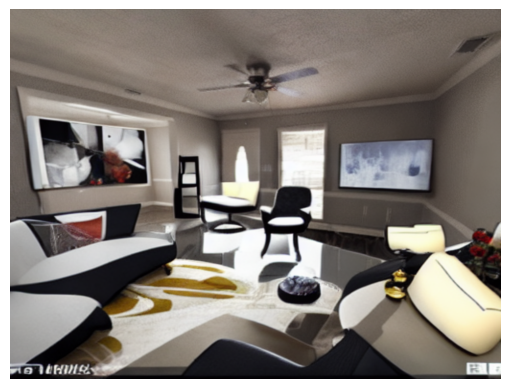

In [ ]:
plt.axis("off")
plt.imshow(generated_images[4])